# Image Smoothing using different linear and non-linear filters

In [156]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2

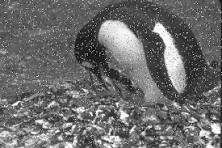

In [3]:
im = Image.open("./images/1.jpg")
im

In [4]:
im_matrix = np.array(im)
im_matrix.shape

(148, 222, 3)

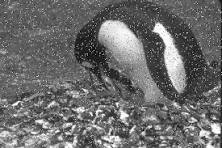

In [5]:
# it is a 3D matrix. Let's convert it to 2D by converting image to grayscale
im_gray = im.convert("L")
im_gray

In [6]:
im_matrix = np.array(im_gray)
im_matrix.shape

(148, 222)

In [7]:
# let's create a linear kernel of size 3x3
kernel = np.array([[1, 1, 1], [1, 1, 1], [1, 1, 1]])
kernel

array([[1, 1, 1],
       [1, 1, 1],
       [1, 1, 1]])

In [8]:
im_matrix

array([[ 93,  70,  80, ...,  43,  20,  22],
       [ 81,  83,  88, ...,  57,  31,  24],
       [ 86,  76,  46, ...,  71,  46,  28],
       ...,
       [ 94,  91, 104, ..., 128,  63,  32],
       [ 99, 117, 132, ..., 129,  67,  33],
       [ 93, 145, 170, ..., 147,  78,  35]], dtype=uint8)

In [9]:
# we will start with the top left corner of the image. So we need to bring the top left corner of the image as center of the kernel. 

# So we will apply a padding by duplicating the border pixels of the image on all sides.
top_row = im_matrix[0, :]
last_row = im_matrix[-1, :]

padded_im = np.vstack((top_row, im_matrix, last_row))
padded_im.shape

(150, 222)

In [11]:
left_col = padded_im[:, 0]
right_col = padded_im[:, -1]

In [12]:
# we will apply padding on the left and right side of the image
padded_im = np.hstack((left_col[:, np.newaxis], padded_im, right_col[:, np.newaxis]))

In [13]:
padded_im.shape

(150, 224)

In [14]:
padded_im

array([[ 93,  93,  70, ...,  20,  22,  22],
       [ 93,  93,  70, ...,  20,  22,  22],
       [ 81,  81,  83, ...,  31,  24,  24],
       ...,
       [ 99,  99, 117, ...,  67,  33,  33],
       [ 93,  93, 145, ...,  78,  35,  35],
       [ 93,  93, 145, ...,  78,  35,  35]], dtype=uint8)

In [15]:
# Now we will apply the convolution operation
result_img = np.zeros(im_matrix.shape)

In [26]:
for row in range(padded_im.shape[0] - kernel.shape[0] + 1):
    for col in range(padded_im.shape[1] - kernel.shape[1] + 1):
        window = padded_im[row:row+3, col:col+3]
        result = np.mean(window * kernel)
        result = np.clip(np.round(result), 0, 255)
        result_img[row, col] = result

In [27]:
result_img.shape

(148, 222)

In [28]:
smoothed_img = Image.fromarray(result_img)

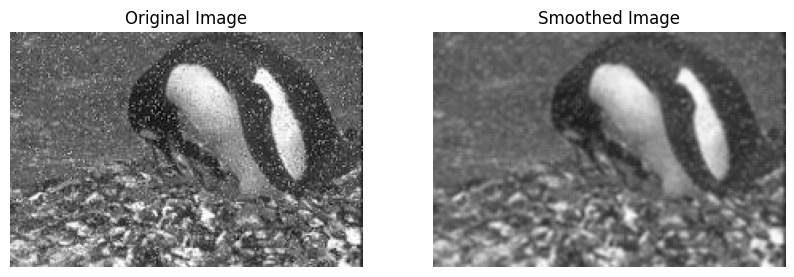

In [29]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(im_gray, cmap="gray")
ax[0].set_title("Original Image")
ax[0].axis("off")
ax[1].imshow(smoothed_img, cmap="gray")
ax[1].set_title("Smoothed Image")
ax[1].axis("off")
plt.show()

In [86]:
def apply_padding(image):
    image = np.array(image)
    top_row = image[0, :]
    last_row = image[-1, :]
    padded_im = np.vstack((top_row, image, last_row))
    
    left_col = padded_im[:, 0]
    right_col = padded_im[:, -1]
    
    padded_im = np.hstack((left_col[:, np.newaxis], padded_im, right_col[:, np.newaxis]))
    
    return padded_im

In [73]:
def convolve(image, kernel):
    resultant_image = np.zeros(image.shape)
    filter_size = kernel.shape

    for row in range(image.shape[0] - kernel.shape[0] + 1):
        for col in range(image.shape[1] - kernel.shape[1] + 1):
            window = image[row:row+filter_size[0], col:col+filter_size[1]]
            result = np.mean(window * kernel)
            result = np.clip(np.round(result), 0, 255)
            resultant_image[row, col] = result
    
    return resultant_image

In [42]:
def plot_two_images(original_img, processed_img, title1="Original", title2="Smoothed"):
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    ax[0].imshow(original_img, cmap="gray")
    ax[0].set_title(title1)
    ax[0].axis("off")
    ax[1].imshow(processed_img, cmap="gray")
    ax[1].set_title(title2)
    ax[1].axis("off")
    plt.show()

# 1. Mean Filter

In [87]:
def mean_filter(image, filter_size=(3,3)):
    gray_image = image.convert("L")
    
    kernel = np.ones(filter_size) / np.prod(filter_size)
    
    # apply padding
    padded_im = apply_padding(gray_image)
    
    # apply convolution
    resultant_image = convolve(padded_im, kernel)
            
    return resultant_image

In [88]:
image = Image.open("./images/1.jpg")
smoothed_img = mean_filter(image, filter_size=(5,5))

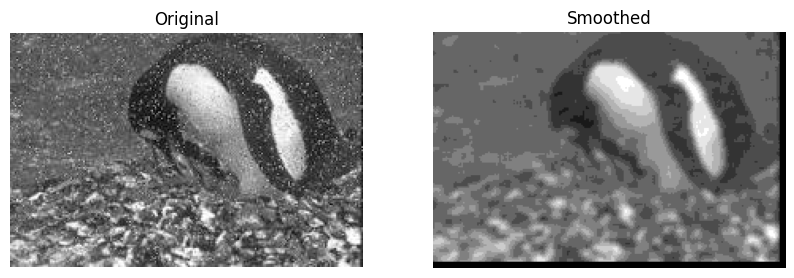

In [89]:
plot_two_images(image, smoothed_img, title1="Original", title2="Smoothed")

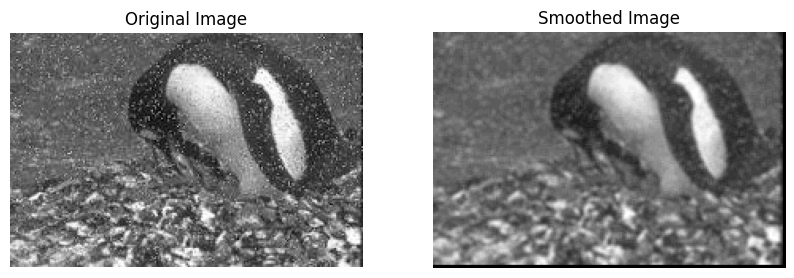

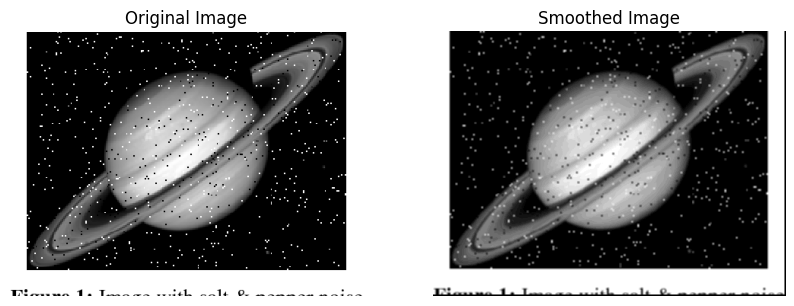

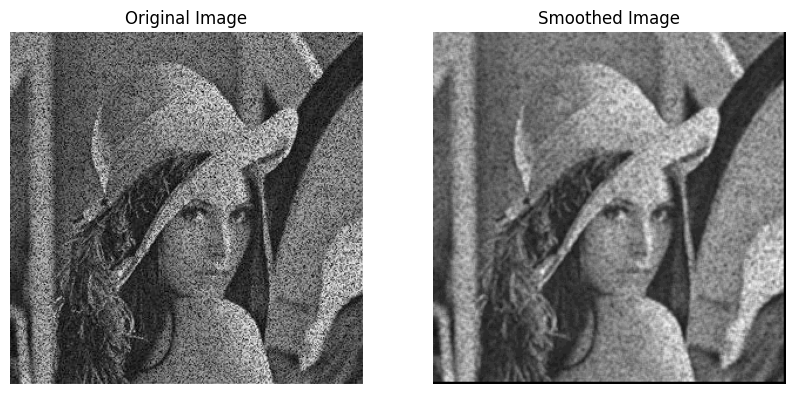

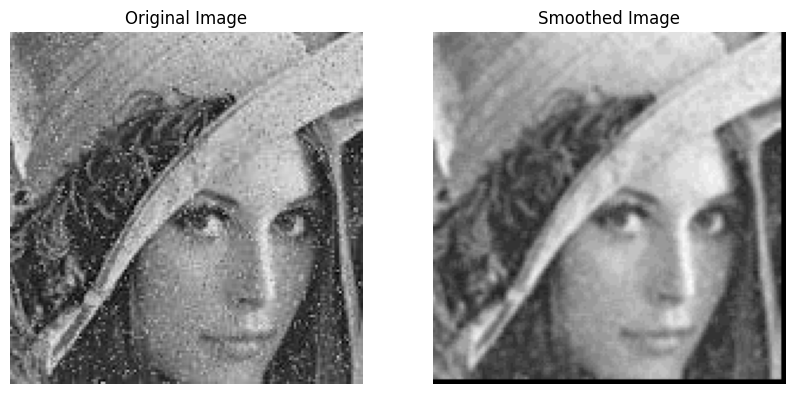

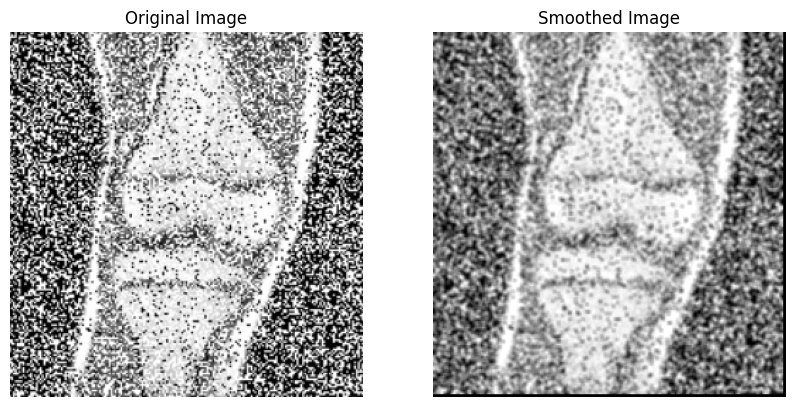

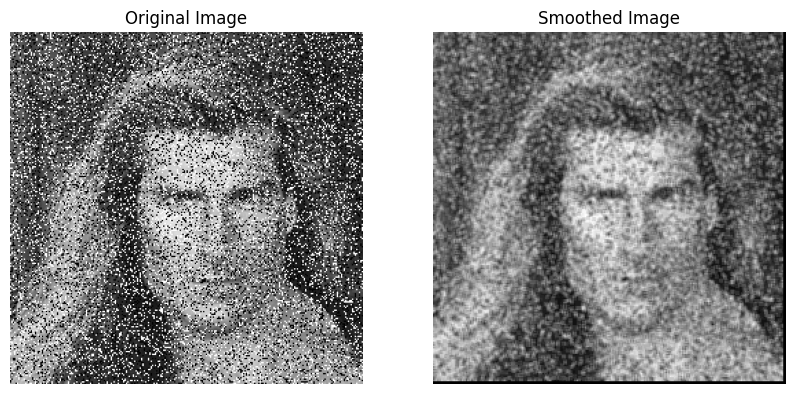

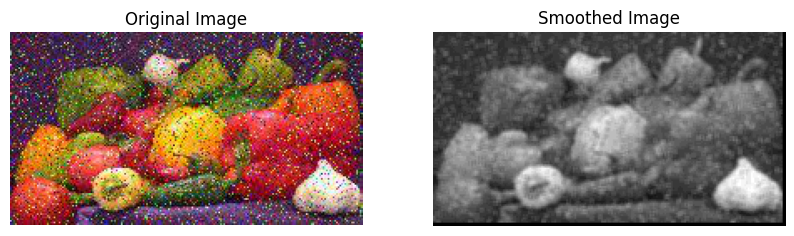

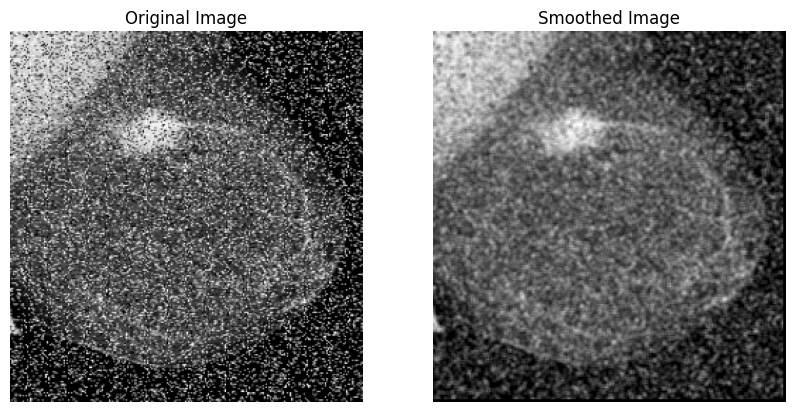

In [78]:
# applying to all the images in the folder

for image in sorted(os.listdir("./images")):
    if image.endswith(".jpg") or image.endswith(".png"):
        image_path = os.path.join("./images", image)
        image = Image.open(image_path)
        smoothed_img = mean_filter(image, filter_size=(3,3))
        plot_two_images(image, smoothed_img, title1="Original Image", title2="Smoothed Image")

# 2. Minimum Filter

In [107]:
def min_filter(image, filter_size=(3,3)):
    gray_image = image.convert("L")
    
    padded_im = apply_padding(gray_image)

    resultant_image = np.zeros(padded_im.shape)
    
    for row in range(0, padded_im.shape[0]):
        for col in range(0, padded_im.shape[1]):
            window = padded_im[row: row+filter_size[0], col: col + filter_size[1]]
            min_value = min(window.ravel())
            resultant_image[row, col] = min_value
    
    return resultant_image    

In [112]:
image = Image.open("./images/1.jpg")
processed_img = min_filter(image, (3,3))

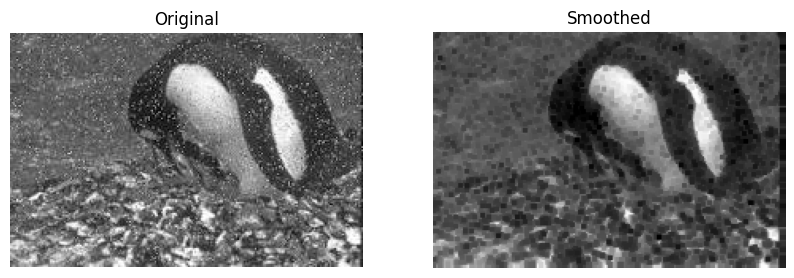

In [113]:
plot_two_images(image, processed_img)

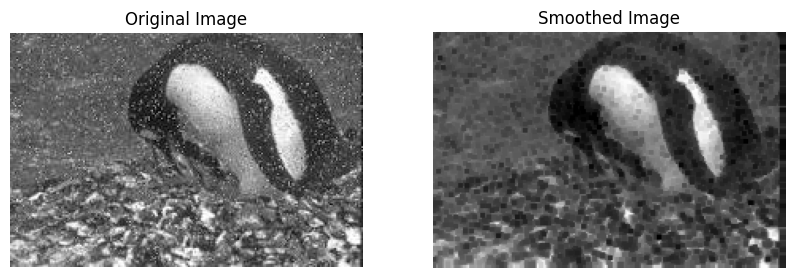

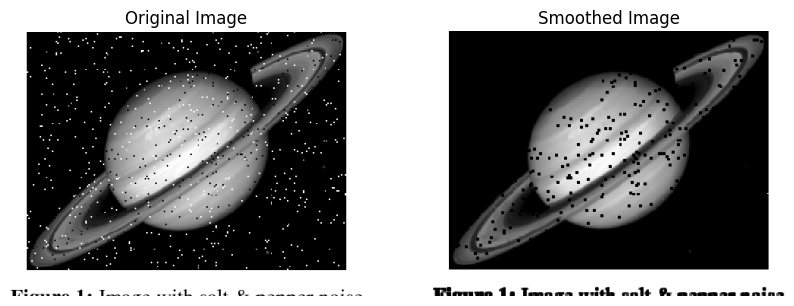

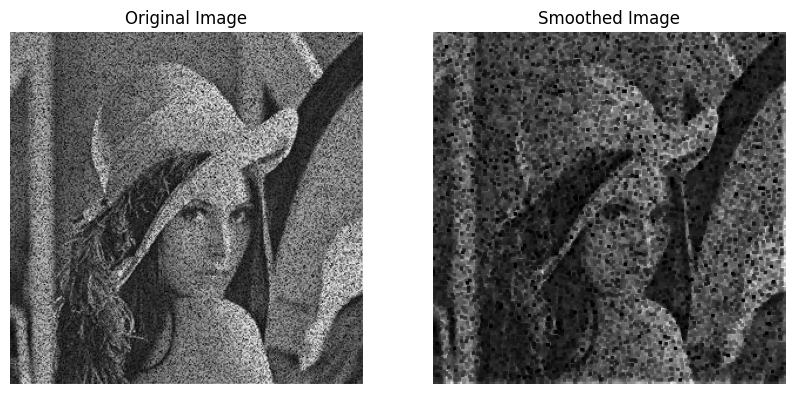

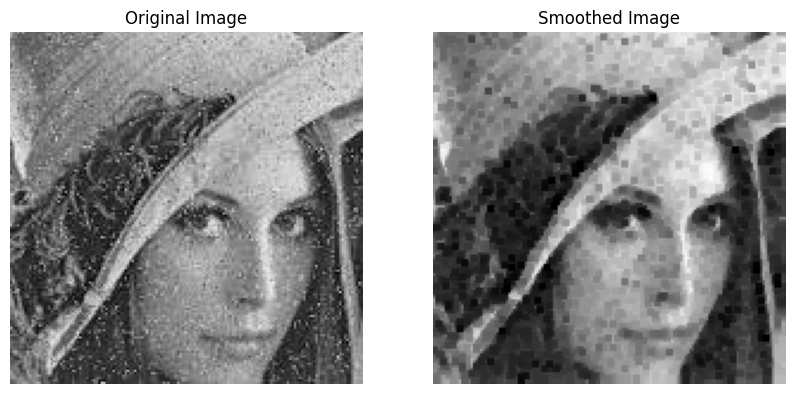

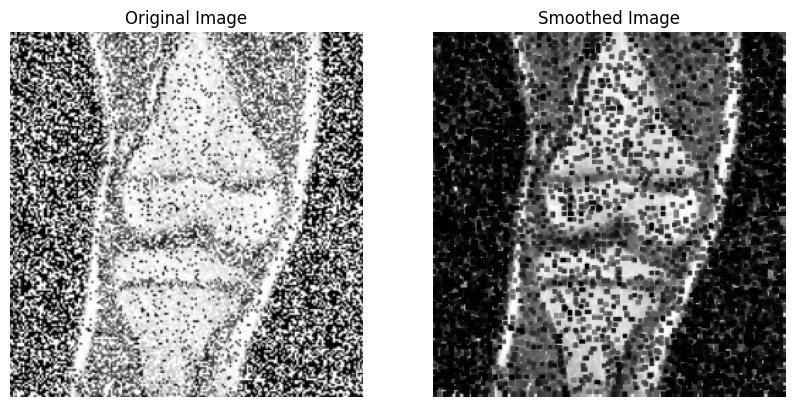

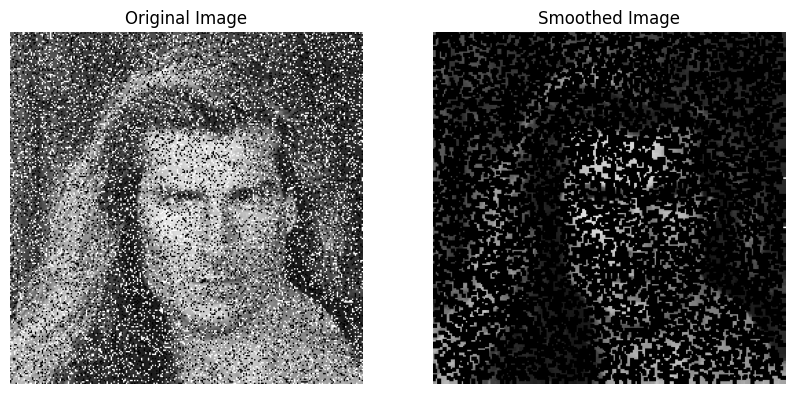

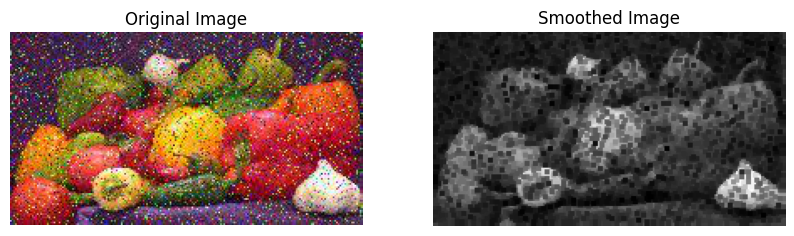

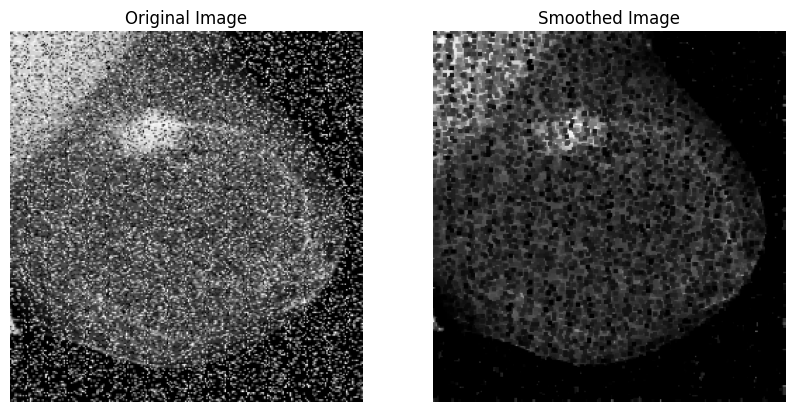

In [114]:
# applying to all the images in the folder
for image in sorted(os.listdir("./images")):
    if image.endswith(".jpg") or image.endswith(".png"):
        image_path = os.path.join("./images", image)
        image = Image.open(image_path)
        smoothed_img = min_filter(image, filter_size=(3,3))
        plot_two_images(image, smoothed_img, title1="Original Image", title2="Smoothed Image")

# 3. Maximum Filter

In [115]:
def max_filter(image, filter_size=(3,3)):
    gray_image = image.convert("L")
    
    padded_im = apply_padding(gray_image)

    resultant_image = np.zeros(padded_im.shape)
    
    for row in range(0, padded_im.shape[0]):
        for col in range(0, padded_im.shape[1]):
            window = padded_im[row: row+filter_size[0], col: col + filter_size[1]]
            min_value = max(window.ravel())
            resultant_image[row, col] = min_value
    
    return resultant_image    

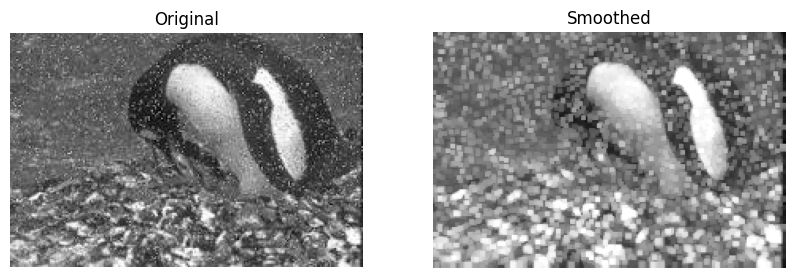

In [116]:
image = Image.open("./images/1.jpg")
processed_img = max_filter(image, (3,3))

plot_two_images(image, processed_img)

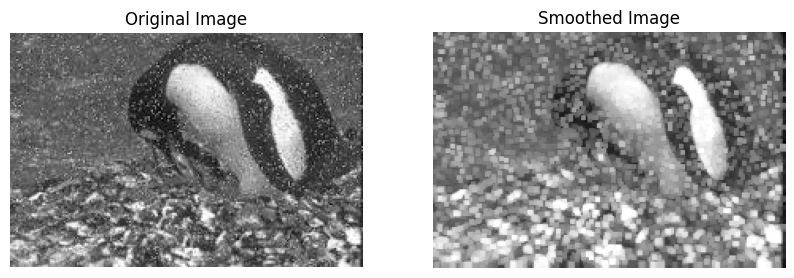

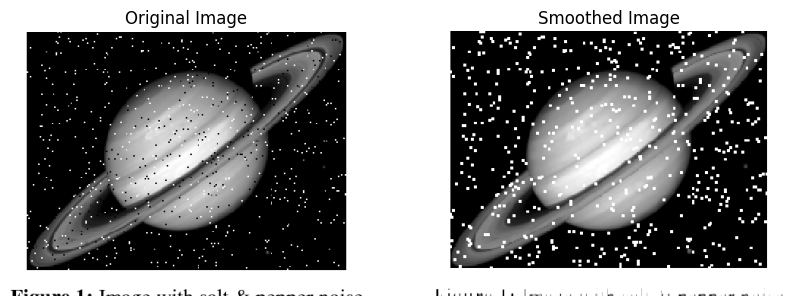

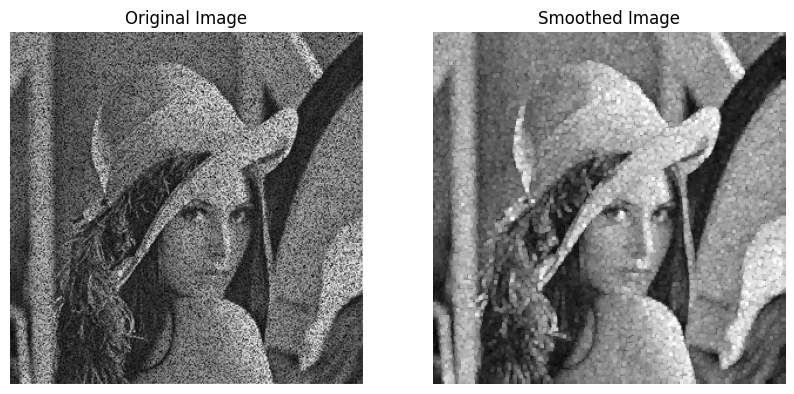

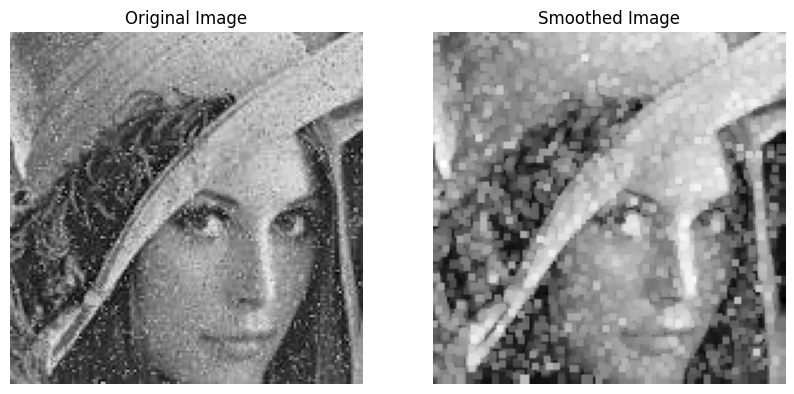

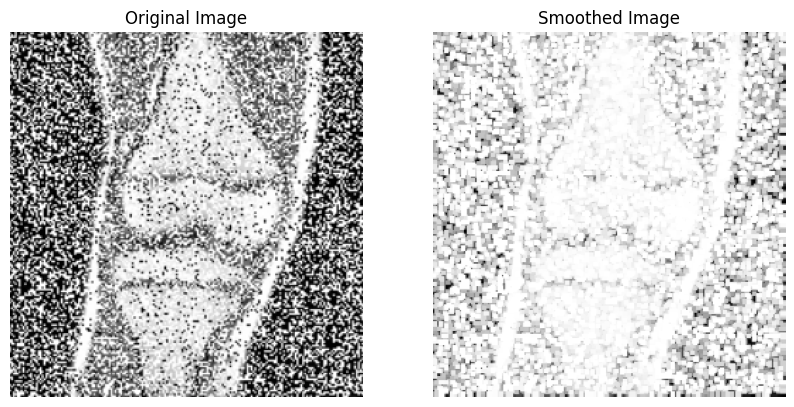

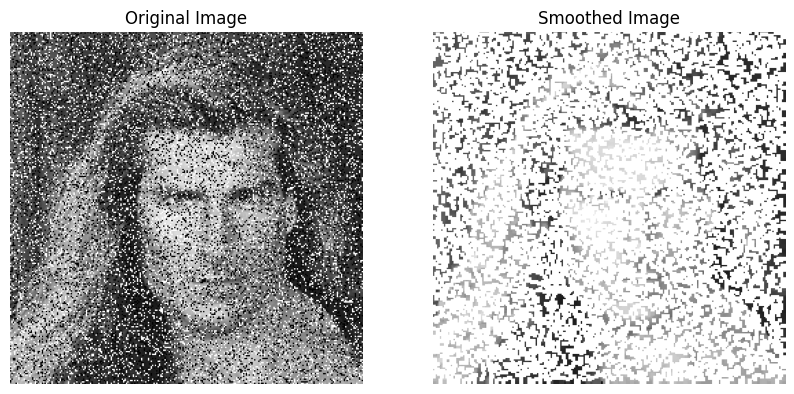

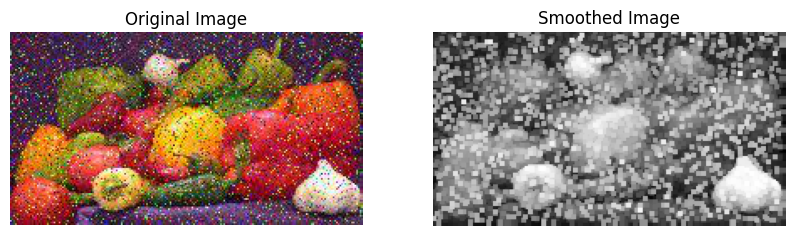

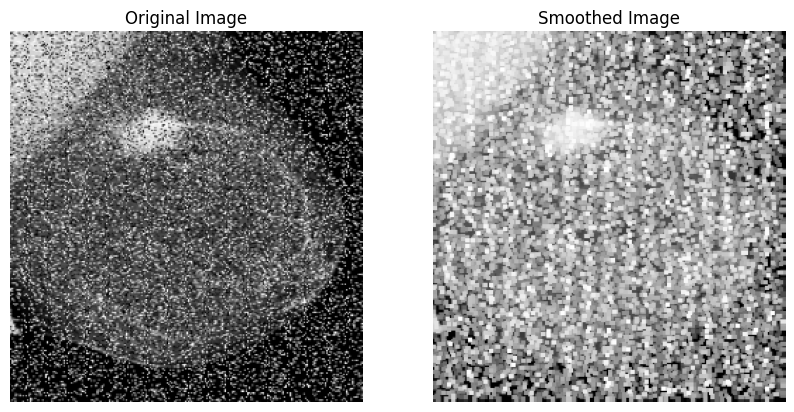

In [118]:
# applying to all the images in the folder
for image in sorted(os.listdir("./images")):
    if image.endswith(".jpg") or image.endswith(".png"):
        image_path = os.path.join("./images", image)
        image = Image.open(image_path)
        smoothed_img = max_filter(image, filter_size=(3,3))
        plot_two_images(image, smoothed_img, title1="Original Image", title2="Smoothed Image")

# 4. Median Filter

In [174]:
def median_filter(image, filter_size=(3,3)):
    padded_im = apply_padding(image)

    resultant_image = np.zeros(padded_im.shape)
    
    for row in range(0, padded_im.shape[0]):
        for col in range(0, padded_im.shape[1]):
            window = padded_im[row: row+filter_size[0], col: col + filter_size[1]]
            window = window.ravel()
            median = np.median(window)
            resultant_image[row, col] = median
    return resultant_image.astype(np.uint8)    

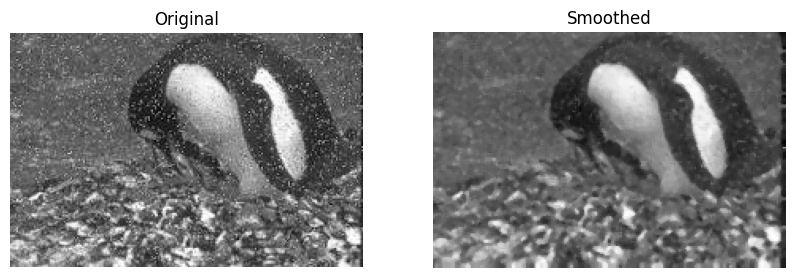

In [144]:
image = Image.open("./images/1.jpg")
processed_img = median_filter(image, (3,3))

plot_two_images(image, processed_img)

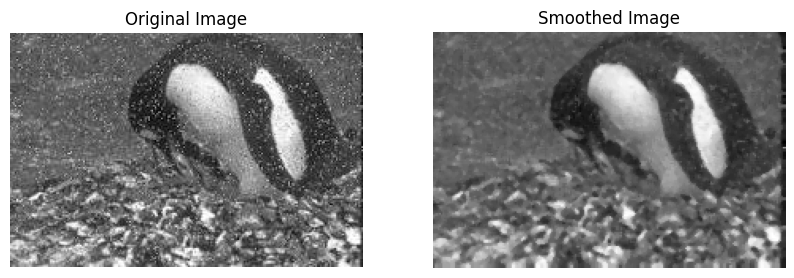

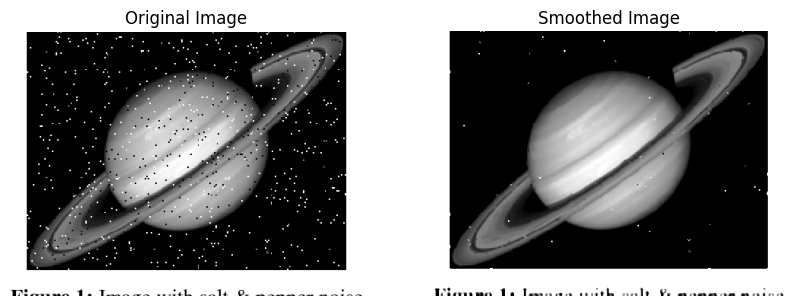

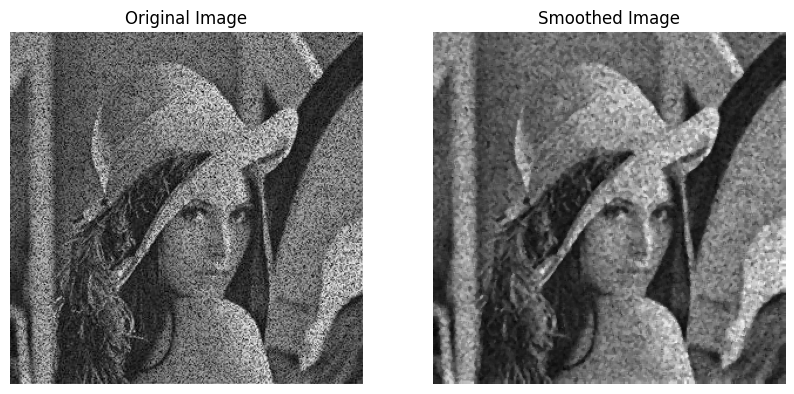

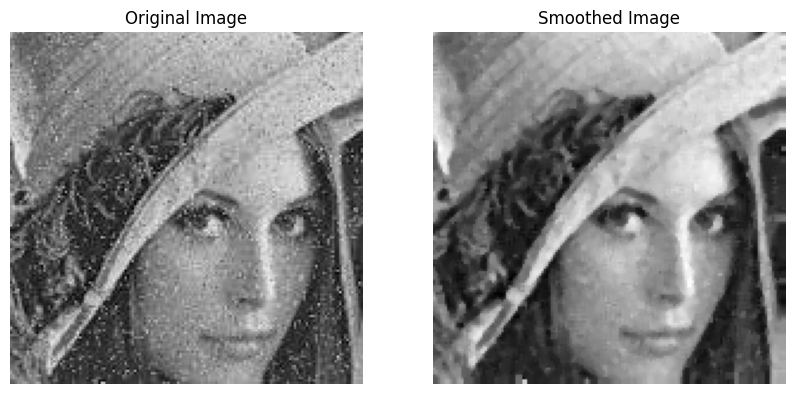

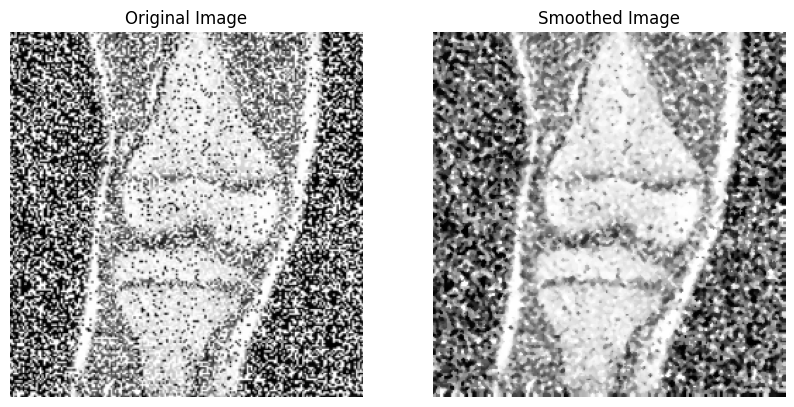

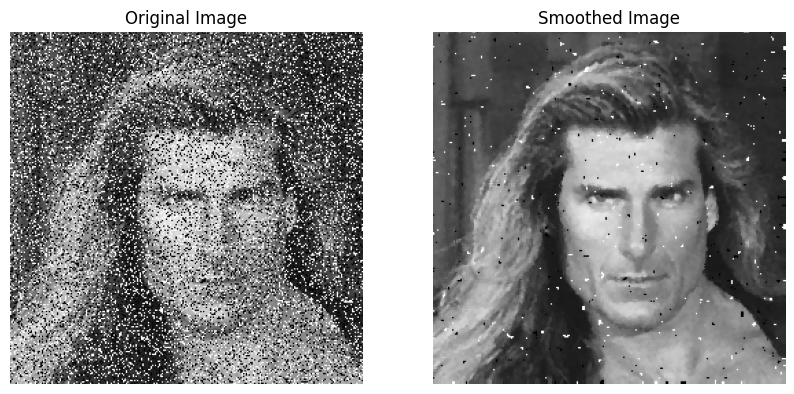

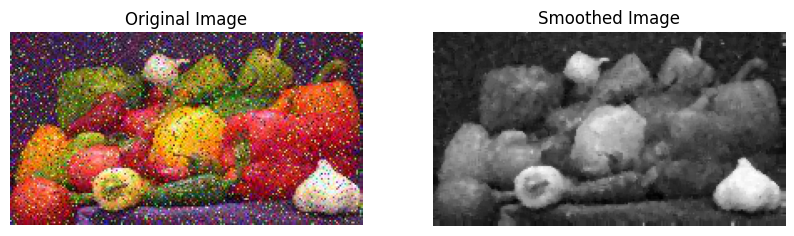

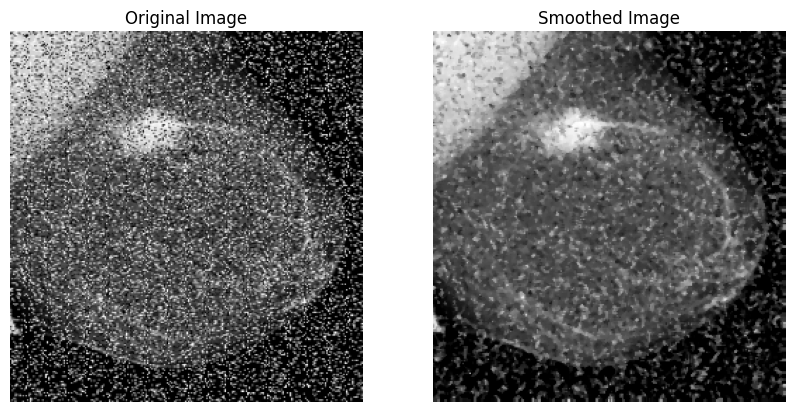

In [139]:
# applying to all the images in the folder
for image in sorted(os.listdir("./images")):
    if image.endswith(".jpg") or image.endswith(".png"):
        image_path = os.path.join("./images", image)
        image = Image.open(image_path)
        smoothed_img = median_filter(image, filter_size=(3,3))
        plot_two_images(image, smoothed_img, title1="Original Image", title2="Smoothed Image")

# Plotting Intensities of Input and Output Image

In [162]:
def plot_img_with_dist(original_img, processed_img, title1="Original", title2="Smoothed"):
    fig, ax = plt.subplots(2, 2, figsize=(10, 5))
    ax[0,0].imshow(original_img, cmap="gray")
    ax[0,0].set_title(title1)
    ax[0,0].axis("off")
    ax[0,1].imshow(processed_img, cmap="gray")
    ax[0,1].set_title(title2)
    ax[0,1].axis("off")
    
    histr_org = cv2.calcHist([np.array(original_img)], [0], None, [256], [0,255])
    histr_proc = cv2.calcHist([processed_img], [0], None, [256], [0,255])

    ax[1,0].plot(histr_org)
    ax[1,0].set_title("Original Histogram")
    
    ax[1,1].plot(histr_proc)
    ax[1,1].set_title("Processed Histogram")

    plt.show()

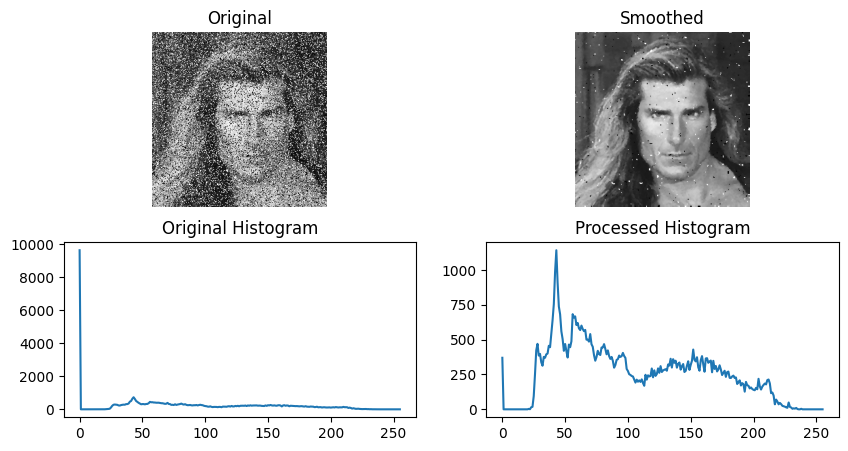

In [175]:
image = Image.open("./images/6.png").convert("L")
image = np.array(image)
processed_img = median_filter(image, (3,3))

plot_img_with_dist(np.array(image), processed_img)

Now there are various ways to compute the correlation betweeen two histograms. One of them is Bhattacharya distance. Other ways are: [https://stats.stackexchange.com/a/151362](https://stats.stackexchange.com/a/151362)

$$
D_{BH}(P,Q) = -\ln ({\sum \sqrt{p(i) * q(i)}})
$$

where, $D_{BH}$ represents the Bhattacharya distance between two probability distributions P and Q

The Bhattacharya distance is non-negative, with a value of 0 indicating that the two distributions are identical. A larger Bhattacharya distance indicates a greater dissimilarity between the distributions.

In [167]:
def calculate_bhattacharya_distance(p, q):
    if len(p) != len(q):
        raise ValueError("Input must have same length")
        
    # bhattacharya coefficient
    bc = sum(np.sqrt(p_i * q_i) for p_i, q_i in zip(p, q))
    
    distance = -np.log(bc)
    
    return distance

In [176]:
histr_org = cv2.calcHist([image], [0], None, [256], [0,255])
histr_org_prob = histr_org / (image.shape[0] * image.shape[1])
histr_proc = cv2.calcHist([processed_img], [0], None, [256], [0,255])
histr_proc_prob = histr_proc / (processed_img.shape[0] * processed_img.shape[1])

In [178]:
bhattacharya_dist = calculate_bhattacharya_distance(histr_org_prob, histr_proc_prob)
bhattacharya_dist

array([0.14980611])